<a href="https://colab.research.google.com/github/P2M-SUJET4-Data-Augmentation/Data-Augmentation-for-medical-images/blob/main/opencv.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import os
import cv2
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
from skimage.io import imshow 
from skimage.transform import resize
from skimage.color import rgb2gray
from cv2 import getRotationMatrix2D, warpAffine, flip
import random
from skimage.restoration import estimate_sigma

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# déclaration des fonctions



In [5]:
def load_image(path):
  image = cv2.imread(path)
  image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  return image

In [6]:
def view_transform(image,transform):
    fig,ax = plt.subplots(nrows=1,ncols=2,figsize=(10,8))

    ax[0].imshow(image,cmap='gray')
    #ax[0].set_axis_off()
    #ax[0].set_title("Original Image", size=20)

    #ax[1].set_axis_off()
    ax[1].imshow(transform , cmap='gray')
    #ax[1].set_title("Transformed", size=20)


In [7]:
from math import log10, sqrt  
def PSNR(original, compressed):
    mse = np.mean((original - compressed) ** 2)
    if(mse == 0):  # MSE is zero means no noise is present in the signal .
                  # Therefore PSNR have no importance.
        return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse))
    print(f"PSNR value is {psnr} dB")

In [8]:
def add_gaussian_noise(img,sigma):
    # Generate Gaussian noise
    gauss = np.random.normal(0,sigma,img.size)
    gauss = gauss.reshape(img.shape[0],img.shape[1]).astype('uint8')
    # Add the Gaussian noise to the image
    img_gauss = cv2.add(img,gauss)
    return img_gauss

In [9]:
def add_SP_noise(image, prob):
    '''
    Add salt and pepper noise to image
    prob: Probability of the noise
    '''
    output = image.copy()
    black = 0
    white = 255            
    probs = np.random.random(output.shape[:2])
    output[probs < (prob / 2)] = black
    output[probs > 1 - (prob / 2)] = white
    return output

# augmentation fonctions

In [10]:
#RESIZE
def resize_image(image,w,h):
    resized_image =cv2.resize(image,(w,h))
    return resized_image

In [11]:
#ROTATION
def rotateImage(image, min_angle, max_angle):
    assert min_angle < max_angle, "min should be less than max val"
    assert min_angle > -360 or max_angle < 360
    width, height = image.shape[0], image.shape[1]  
    range_random = random.randint(min_angle, max_angle)
    rm = getRotationMatrix2D((width/2,height/2), range_random, 1)
    rotated_image = warpAffine(image, rm, (width,height))
    return rotated_image

In [12]:
#FLIPPING
def flip_image(image,dir):
    image = cv2.flip(image, dir)
    return image

In [13]:
#CROPPING
#(y1,y2,x1,x2)(bottom,top,left,right)
def crop_image(image,y1,y2,x1,x2):
    image=image[y1:y2,x1:x2]
    return image

In [14]:
#TRANSLATION
def translation_image(image,x,y):
    rows, cols ,c = image.shape
    M = np.float32([[1, 0, x], [0, 1, y]])
    image = cv2.warpAffine(image, M, (cols, rows))
    return image

In [15]:
#SATURATION
def saturation_image(image,saturation):
    image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    v = image[:, :, 2]
    v = np.where(v <= 255 - saturation, v + saturation, 255)
    image[:, :, 2] = v

    image = cv2.cvtColor(image, cv2.COLOR_HSV2BGR)
    return image
    #cv2.imwrite(Folder_name + "/saturation-" + str(saturation) + Extension, image)

In [16]:
#gamma <1 ==>  expansion(lighter) / gamma >1 ==> compression (darker)
def gamma(image, gamma):
    assert gamma > 0
    table = np.array([((i / 255.0) ** gamma) * 255 for i in np.arange(0, 256)]).astype("uint8")
    image=cv2.LUT(image, table)
    return image

In [17]:
#CLAHE
def clahe_img(image,clip=0.5):
  image= cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
  clahe = cv2.createCLAHE(clipLimit=clip, tileGridSize=(8,8))  #Define tile size and clip limit. 
  clahe_img = clahe.apply(image)
  return image

In [18]:
#FILTRE GAUSSIEN
#sigma augmente flou augmente
#fil_size is the window size
def gaussian_blur(image,fil_size,sigma=0):
    assert fil_size >= 0
    assert(fil_size % 2) == 1
    image = cv2.GaussianBlur(image,(fil_size,fil_size),sigma,borderType=cv2.BORDER_CONSTANT)
    return image

In [19]:
#FILTRE MEDIAN
def median_blur(image,ksize):  
    assert(ksize % 2) == 1
    image = cv2.medianBlur(image,ksize)
    return image

In [20]:
#FILTRE BILATERALE
def bilateral_blur(image,a,b,c):   
    image = cv2.bilateralFilter(image,a,b,c)
    return image

# Test sur image "Breast ultrasound"



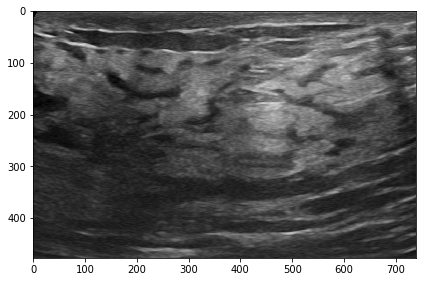

In [21]:
img_path="/content/drive/MyDrive/Colab Notebooks/OpenCV/normal (130).jpeg"
image=load_image(img_path)
imshow(image)

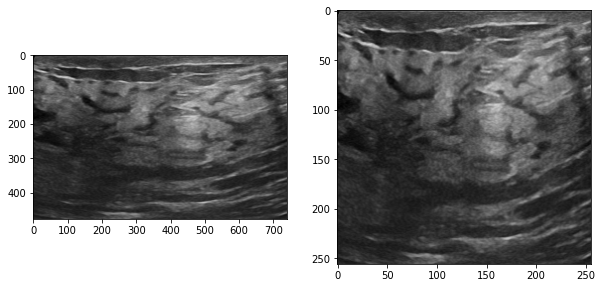

In [22]:
view_transform(image, resize_image(image,256,256))

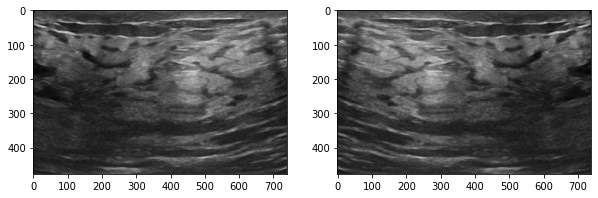

In [23]:
view_transform(image, flip_image(image,50)) 

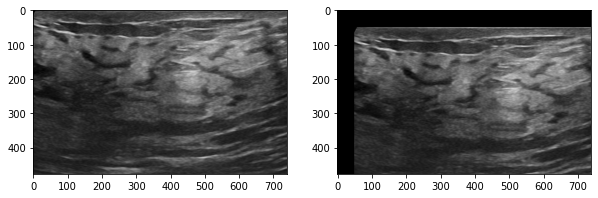

In [24]:
view_transform(image,translation_image(image,50,50))

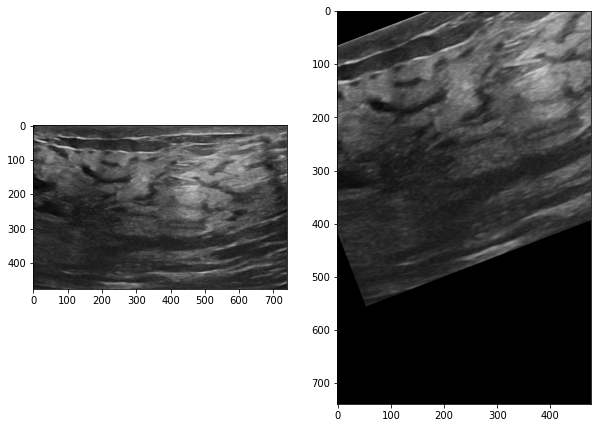

In [25]:
rot_img=rotateImage(image,0,90)
view_transform(image, rot_img)

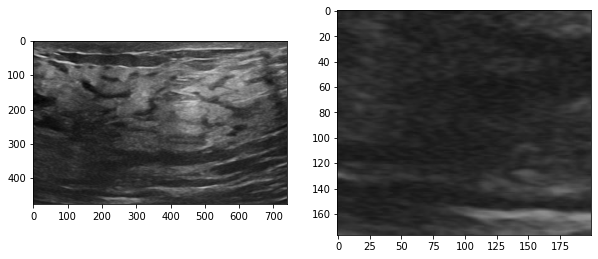

In [26]:
view_transform(image, crop_image(image,300,600,100,300)) 

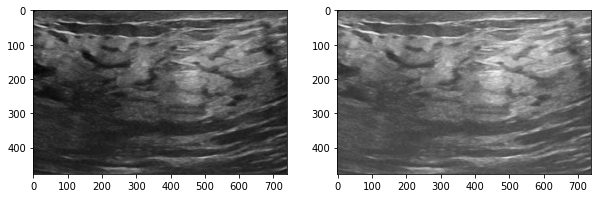

In [27]:
view_transform(image,saturation_image(image,40)) 

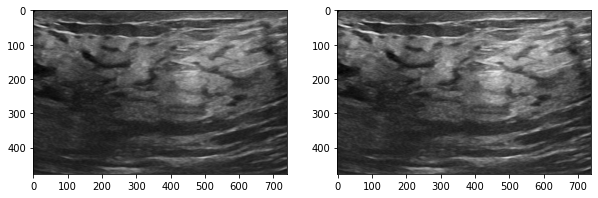

In [28]:
view_transform(image,clahe_img(image))


# Test sur image Mammographie



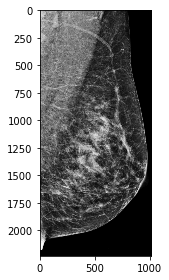

In [29]:
img_path="/content/drive/MyDrive/Colab Notebooks/OpenCV/mammo (1).jpeg"
image=load_image(img_path)
imshow(image)

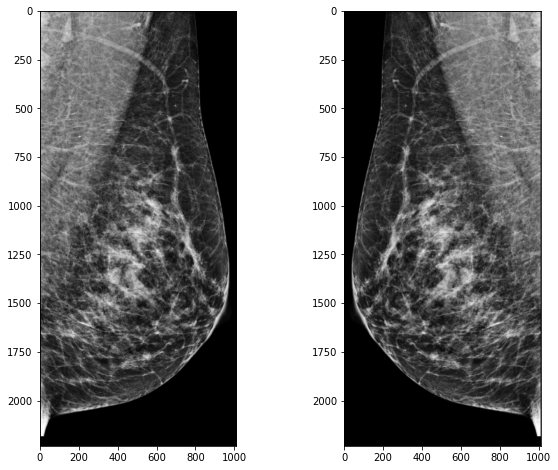

In [30]:
view_transform(image,flip_image(image,1)) 

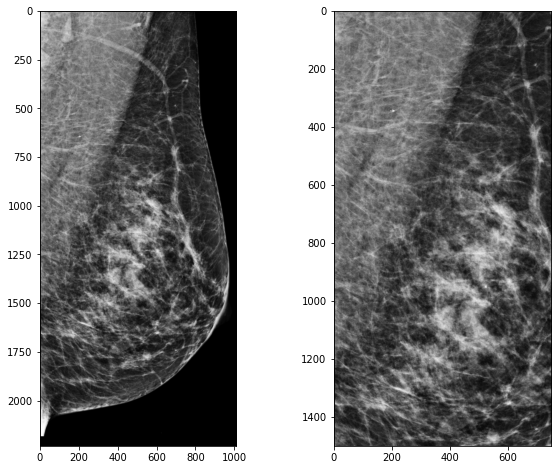

In [31]:
view_transform(image,crop_image(image,300,1800,0,750)) 

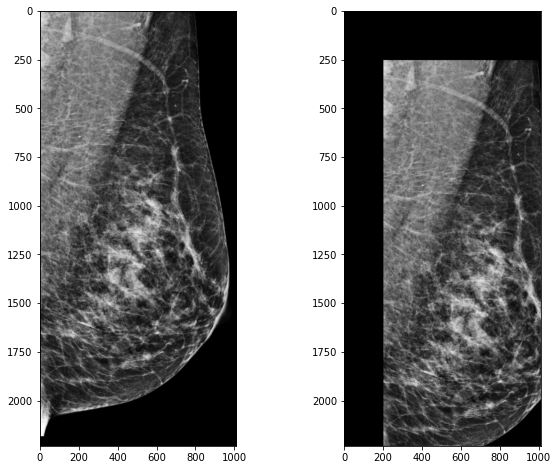

In [32]:
view_transform(image,translation_image(image,200,250))

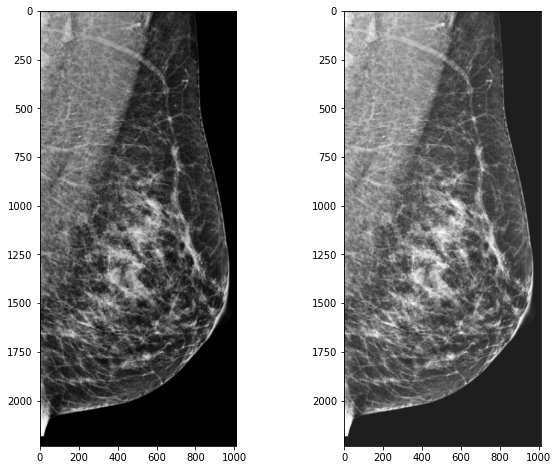

In [33]:
view_transform(image, saturation_image(image,30)) 

# Correction Gamma pour image Breast ultrasound"

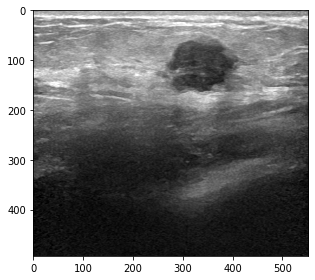

In [34]:
img_path="/content/drive/MyDrive/Colab Notebooks/OpenCV/Ultrasound.jpeg"
image=load_image(img_path)
imshow(image)

PSNR value is 27.575572393995557 dB
None


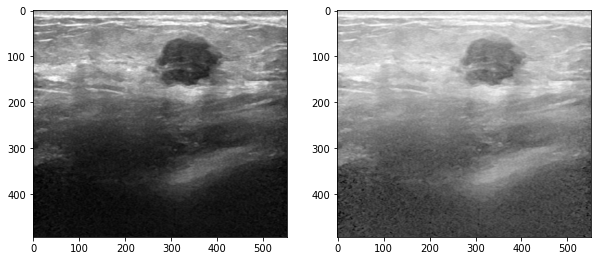

In [35]:
img_gam = gamma(image,0.5)
view_transform(image, img_gam)
print(PSNR(image,img_gam))

PSNR value is 27.19390844701902 dB
None


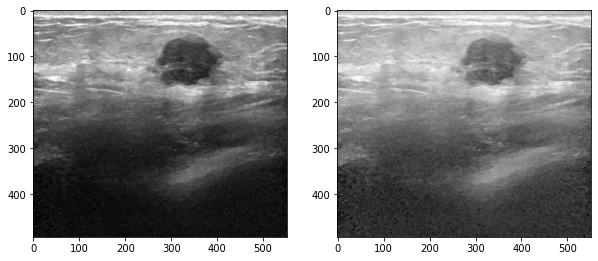

In [36]:
img_gam = gamma(image,0.6)
view_transform(image, img_gam)
print(PSNR(image,img_gam))

PSNR value is 28.054711355171737 dB
None


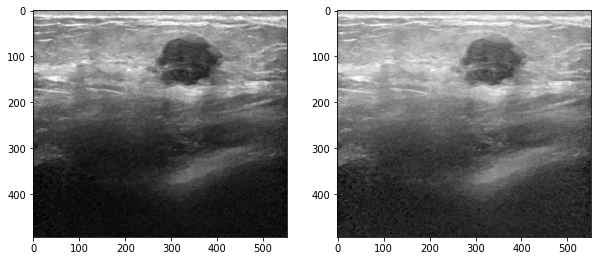

In [37]:
img_gam = gamma(image,0.7)
view_transform(image, img_gam)
print(PSNR(image,img_gam))

PSNR value is 27.492801352784436 dB
None


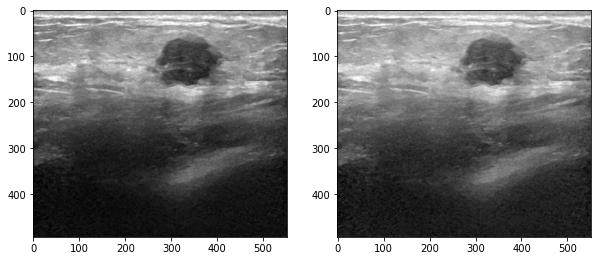

In [38]:
img_gam = gamma(image,0.8)
view_transform(image, img_gam)
print(PSNR(image,img_gam))

PSNR value is 30.909838000250467 dB
None


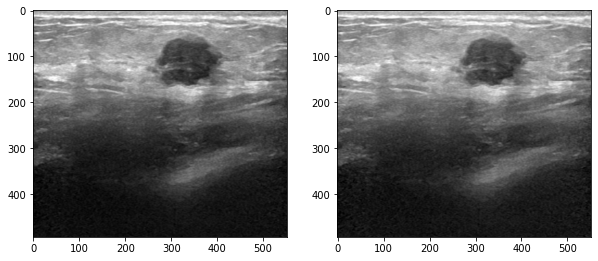

In [39]:
img_gam = gamma(image,0.9)
view_transform(image, img_gam)
print(PSNR(image,img_gam))

PSNR value is 30.84211253679442 dB
None


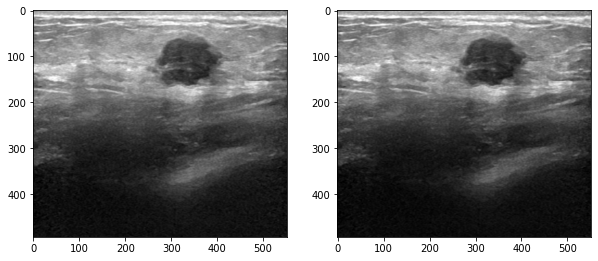

In [40]:
img_gam = gamma(image,1.1)
view_transform(image, img_gam)
print(PSNR(image,img_gam))

PSNR value is 28.632730098984695 dB
None


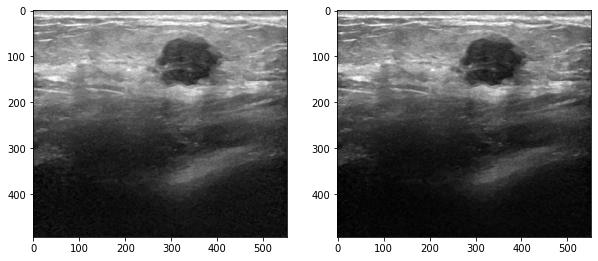

In [41]:
img_gam = gamma(image,1.2)
view_transform(image, img_gam)
print(PSNR(image,img_gam))

PSNR value is 27.737653574402145 dB
None


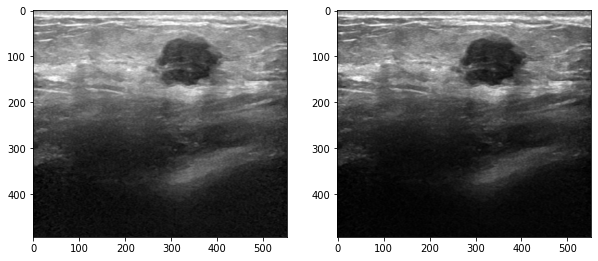

In [42]:
img_gam = gamma(image,1.3)
view_transform(image, img_gam)
print(PSNR(image,img_gam))

# Correction Gamma pour image mammographie

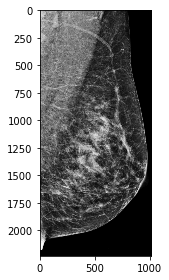

In [43]:
img_path="/content/drive/MyDrive/Colab Notebooks/OpenCV/mammo (1).jpeg"
image=load_image(img_path)
imshow(image)

PSNR value is 28.95071927582949 dB
None


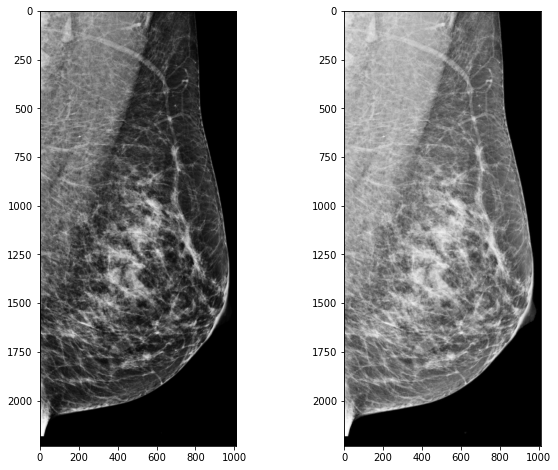

In [44]:
img_gam = gamma(image,0.5)
view_transform(image, img_gam)
print(PSNR(image,img_gam))

PSNR value is 27.83237153550425 dB
None


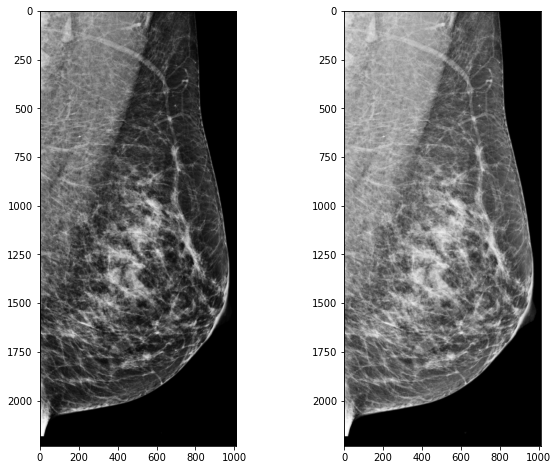

In [45]:
img_gam = gamma(image,0.6)
view_transform(image, img_gam)
print(PSNR(image,img_gam))

PSNR value is 29.528578201601334 dB
None


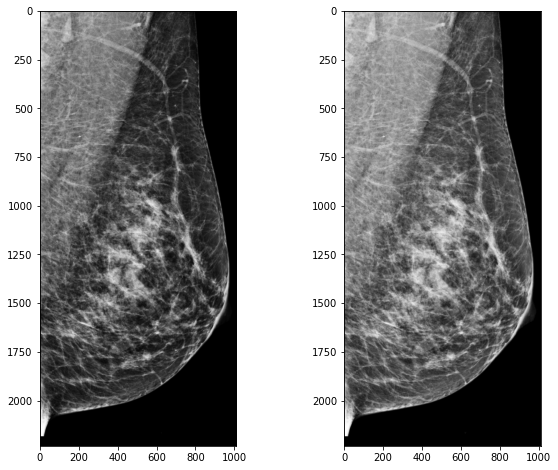

In [46]:
img_gam = gamma(image,0.7)
view_transform(image, img_gam)
print(PSNR(image,img_gam))

PSNR value is 28.92277289578918 dB
None


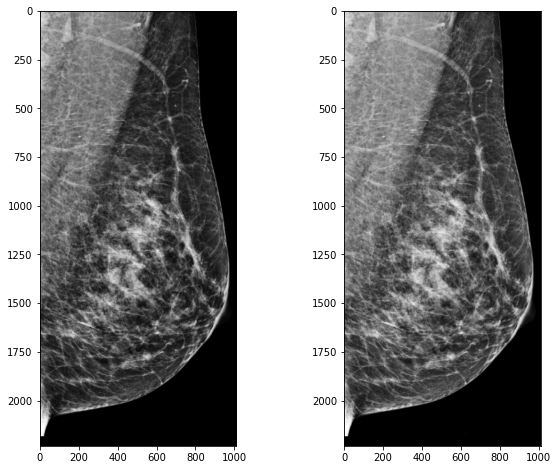

In [47]:
img_gam = gamma(image,0.8)
view_transform(image, img_gam)
print(PSNR(image,img_gam))

PSNR value is 30.90061164769386 dB
None


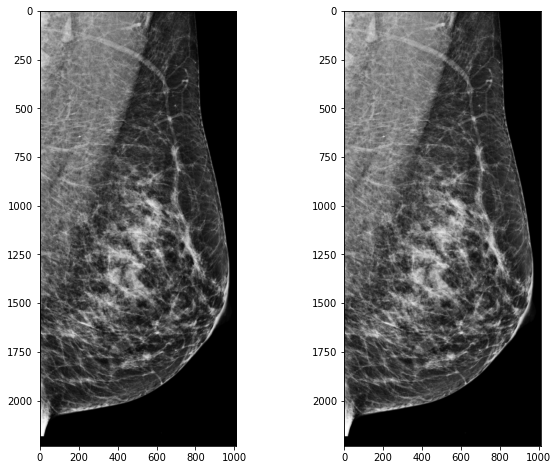

In [48]:
img_gam = gamma(image,0.9)
view_transform(image, img_gam)
print(PSNR(image,img_gam))

PSNR value is 30.91524472012134 dB
None


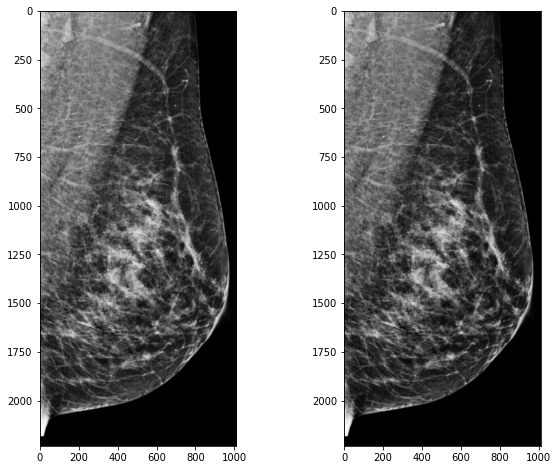

In [49]:
img_gam = gamma(image,1.1)
view_transform(image, img_gam)
print(PSNR(image,img_gam))

PSNR value is 29.69960079903277 dB
None


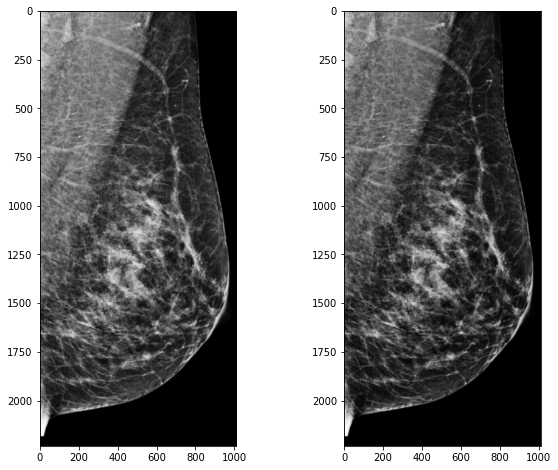

In [50]:
img_gam = gamma(image,1.2)
view_transform(image, img_gam)
print(PSNR(image,img_gam))

PSNR value is 29.000054632420813 dB
None


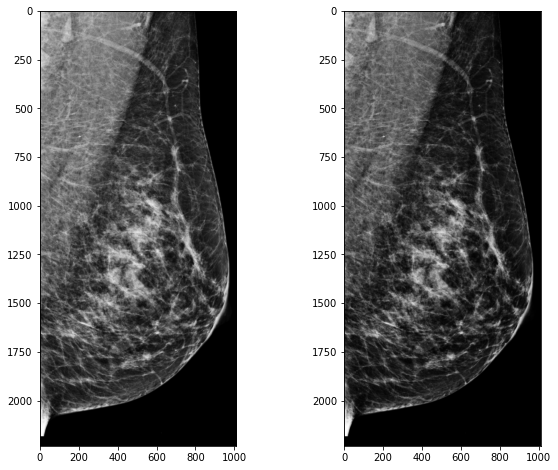

In [51]:
img_gam = gamma(image,1.3)
view_transform(image, img_gam)
print(PSNR(image,img_gam))

# Filtre Gaussien sur image "Breast ultrasound"

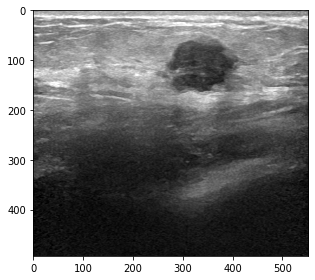

In [52]:
img_path="/content/drive/MyDrive/Colab Notebooks/OpenCV/Ultrasound.jpeg"
image=cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
imshow(image)

PSNR value is 44.0106612158816 dB
None


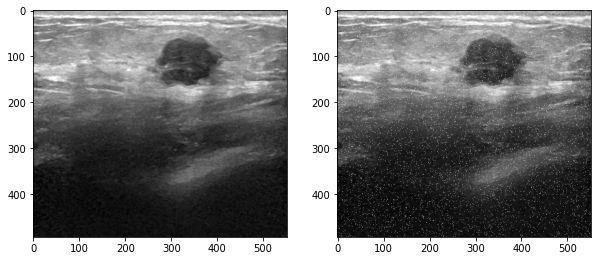

In [53]:
img_noise=add_gaussian_noise(image,0.5)
view_transform(image,img_noise)
print(PSNR(image,img_noise))

PSNR value is 34.099645579508 dB
None


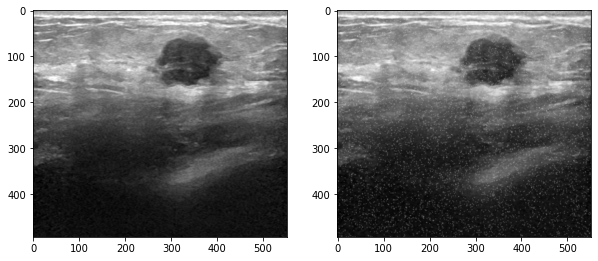

In [54]:
denoised_img=gaussian_blur(img_noise,3)
view_transform(image,denoised_img)
print(PSNR(image,denoised_img))

PSNR value is 32.95261907706417 dB
None


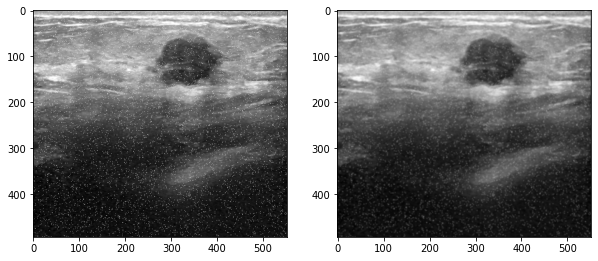

In [55]:
denoised_img=gaussian_blur(img_noise,5)
view_transform(img_noise,denoised_img)
print(PSNR(image,denoised_img))

PSNR value is 31.839489148248997 dB
None


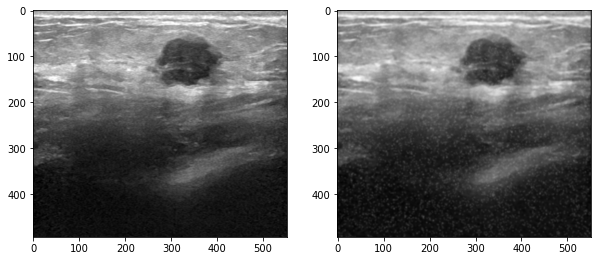

In [56]:
denoised_img=gaussian_blur(img_noise,7)
view_transform(image,denoised_img)
print(PSNR(image,denoised_img))

# Filtre Gaussien sur Mammographie

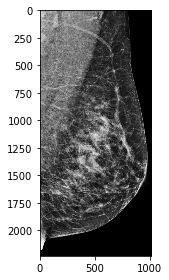

In [57]:
img_path="/content/drive/MyDrive/Colab Notebooks/OpenCV/mammo (1).jpeg"
image=cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
imshow(image)

PSNR value is 36.83720958110379 dB
None


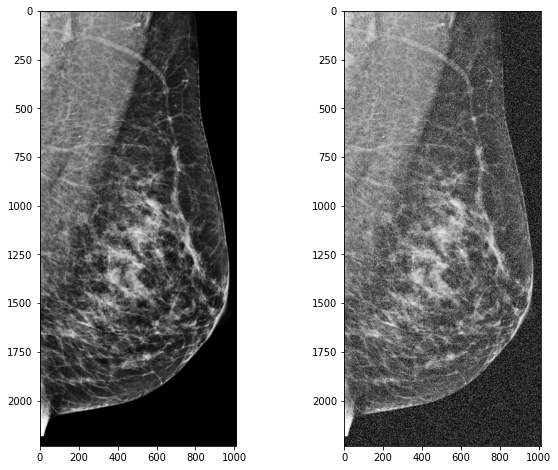

In [58]:
img_noise=add_gaussian_noise(image,1)
view_transform(image,img_noise)
print(PSNR(image,img_noise))

PSNR value is 29.495058244656267 dB
None


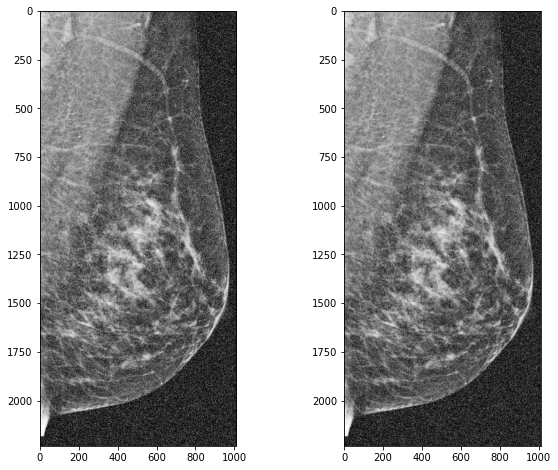

In [59]:
denoised_img=gaussian_blur(img_noise,3)
view_transform(img_noise,denoised_img)
print(PSNR(image,denoised_img))

PSNR value is 28.037281886906417 dB
None


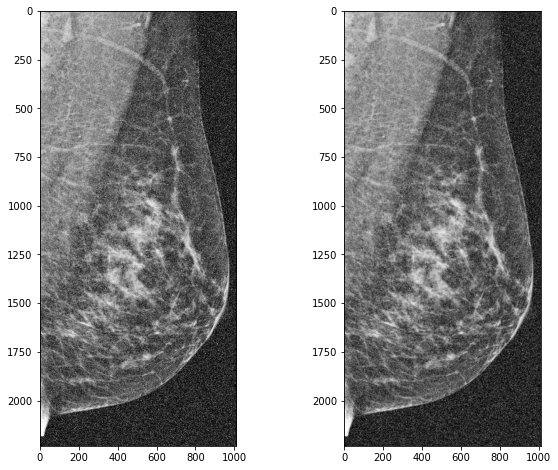

In [60]:
denoised_img=gaussian_blur(img_noise,5)
view_transform(img_noise,denoised_img)
print(PSNR(image,denoised_img))

PSNR value is 27.69067405793397 dB
None


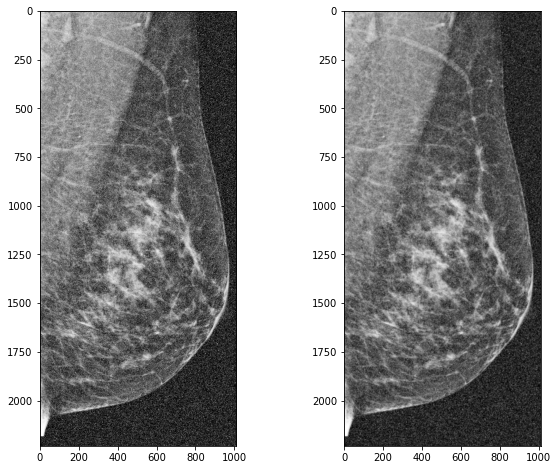

In [61]:
denoised_img=gaussian_blur(img_noise,7)
view_transform(img_noise,denoised_img)
print(PSNR(image,denoised_img))

# Filtre Median sur image "Breast ultrasound"


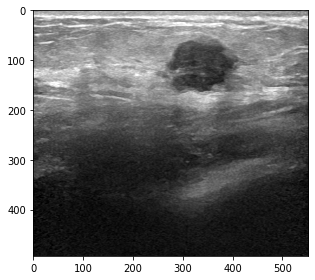

In [62]:
img_path="/content/drive/MyDrive/Colab Notebooks/OpenCV/Ultrasound.jpeg"
image=cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
imshow(image)

PSNR value is 38.75587487551795 dB
None


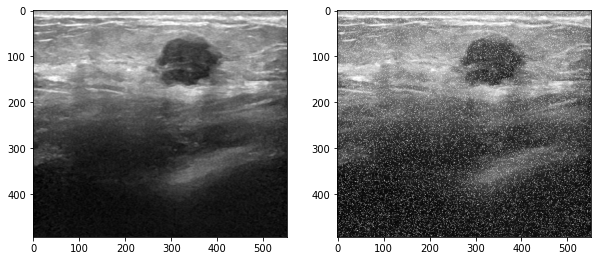

In [63]:
img_noise=add_gaussian_noise(image,0.7)
view_transform(image,img_noise)
print(PSNR(image,img_noise))

PSNR value is 39.243931436040775 dB
None


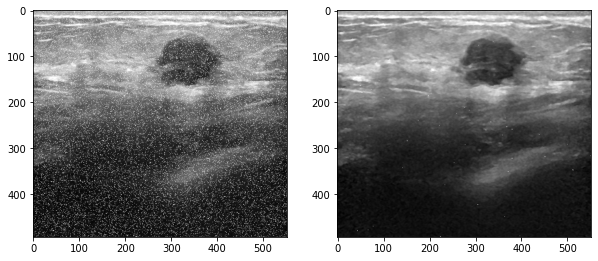

In [64]:
denoised_img=median_blur(img_noise,3)
view_transform(img_noise,denoised_img)
print(PSNR(image,denoised_img))

PSNR value is 35.18274532900027 dB
None


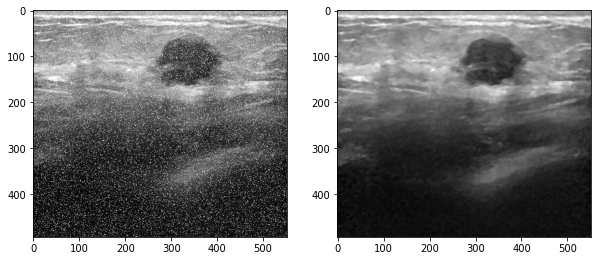

In [65]:
denoised_img=median_blur(img_noise,5)
view_transform(img_noise,denoised_img)
print(PSNR(image,denoised_img))

PSNR value is 33.39828517138838 dB
None


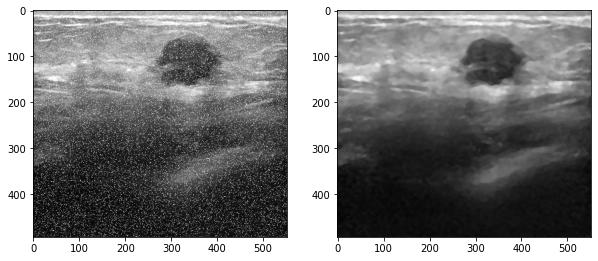

In [66]:
denoised_img=median_blur(img_noise,7)
view_transform(img_noise,denoised_img)
print(PSNR(image,denoised_img))

PSNR value is 34.6965496186994 dB
None


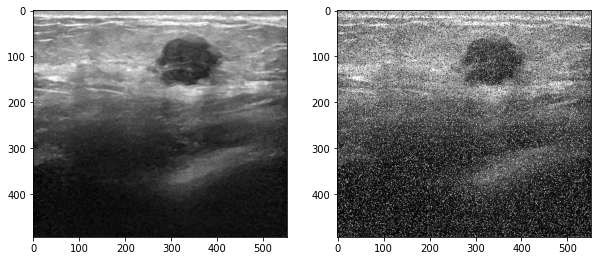

In [67]:
img_SP=add_SP_noise(image,0.2)
view_transform(image,img_SP)
print(PSNR(image,img_SP))

PSNR value is 37.90538653541585 dB
None


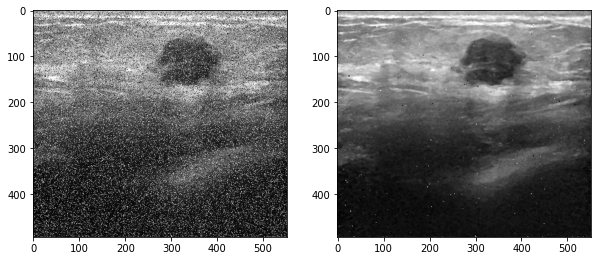

In [68]:
denoised_img=median_blur(img_SP,3)
view_transform(img_SP,denoised_img)
print(PSNR(image,denoised_img))

PSNR value is 35.009458369083085 dB
None


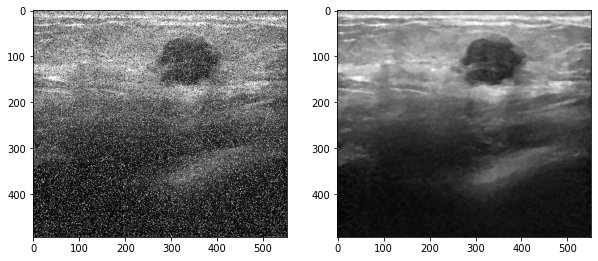

In [69]:
denoised_img=median_blur(img_SP,5)
view_transform(img_SP,denoised_img)
print(PSNR(image,denoised_img))

PSNR value is 33.44492977641743 dB
None


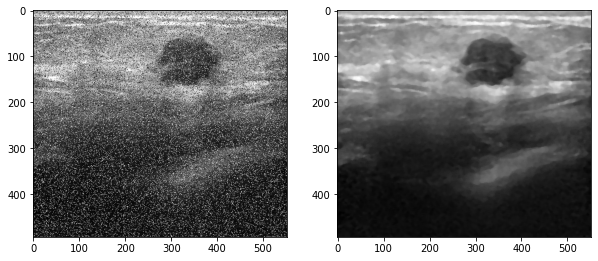

In [70]:
denoised_img=median_blur(img_SP,7)
view_transform(img_SP,denoised_img)
print(PSNR(image,denoised_img))

# Filtre Median sur Mammographie

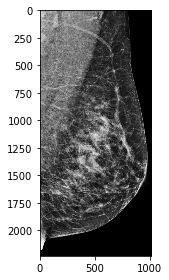

In [71]:
img_path="/content/drive/MyDrive/Colab Notebooks/OpenCV/mammo (1).jpeg"
image=cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
imshow(image)

PSNR value is 36.83171524189886 dB
None


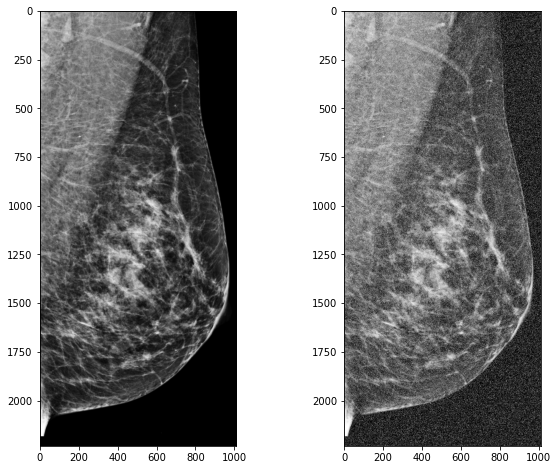

In [72]:
img_noise=add_gaussian_noise(image,1)
view_transform(image,img_noise)
print(PSNR(image,img_noise))

PSNR value is 35.03575925470444 dB
None


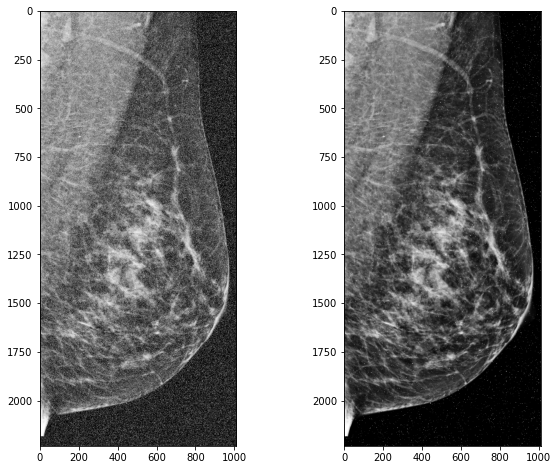

In [73]:
denoised_img=median_blur(img_noise,3)
view_transform(img_noise,denoised_img)
print(PSNR(image,denoised_img))

PSNR value is 33.255399644775984 dB
None


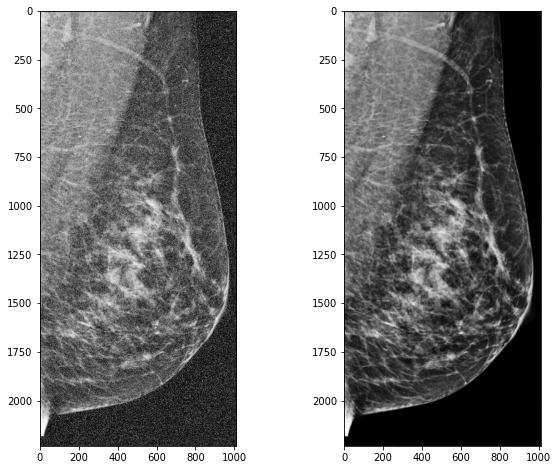

In [74]:
denoised_img=median_blur(img_noise,5)
view_transform(img_noise,denoised_img)
print(PSNR(image,denoised_img))

PSNR value is 32.3390625014734 dB
None


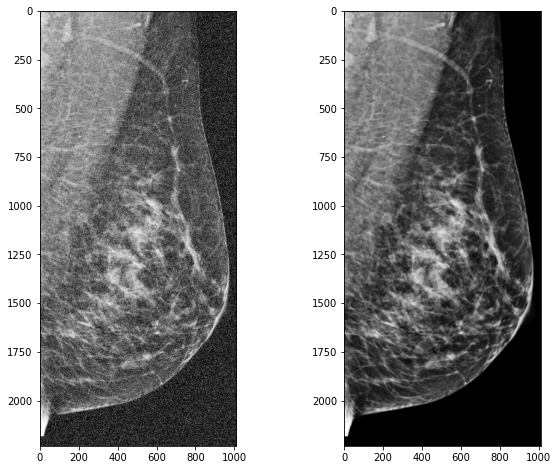

In [75]:
denoised_img=median_blur(img_noise,7)
view_transform(img_noise,denoised_img)
print(PSNR(image,denoised_img))

PSNR value is 35.898679815119614 dB
None


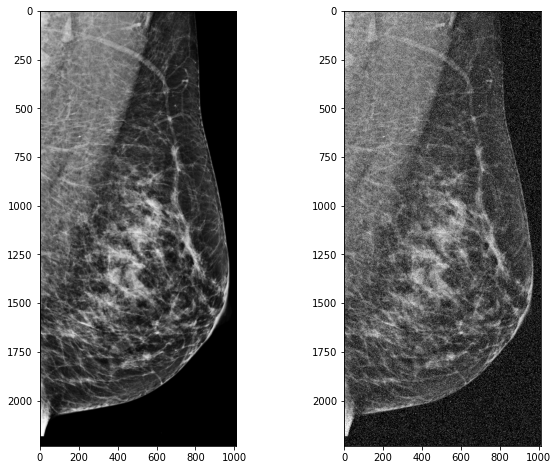

In [78]:
img_SP=add_SP_noise(image,0.2)
view_transform(image,img_SP)
print(PSNR(image,img_SP))

PSNR value is 35.56025416185322 dB
None


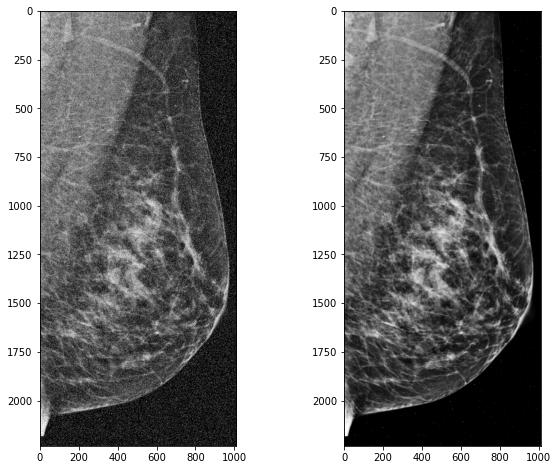

In [79]:
denoised_img=median_blur(img_SP,3)
view_transform(img_SP,denoised_img)
print(PSNR(image,denoised_img))

PSNR value is 33.75421549539468 dB
None


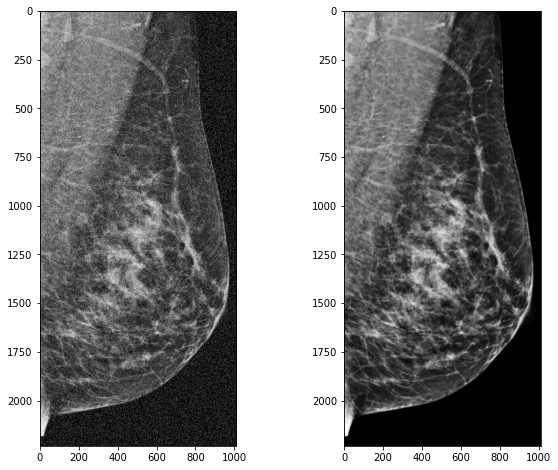

In [80]:
denoised_img=median_blur(img_SP,5)
view_transform(img_SP,denoised_img)
print(PSNR(image,denoised_img))

PSNR value is 32.7913348338216 dB
None


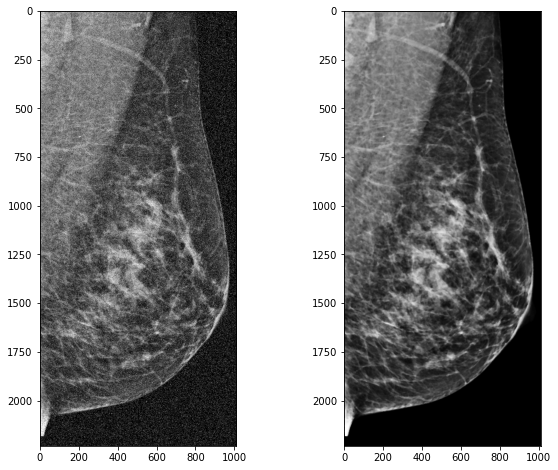

In [81]:
denoised_img=median_blur(img_SP,7)
view_transform(img_SP,denoised_img)
print(PSNR(image,denoised_img))

# Filtre bilaterale 

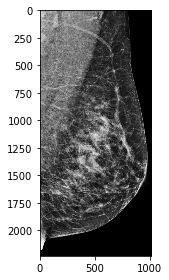

In [82]:
img_path="/content/drive/MyDrive/Colab Notebooks/OpenCV/mammo (1).jpeg"
image=cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
imshow(image)

100


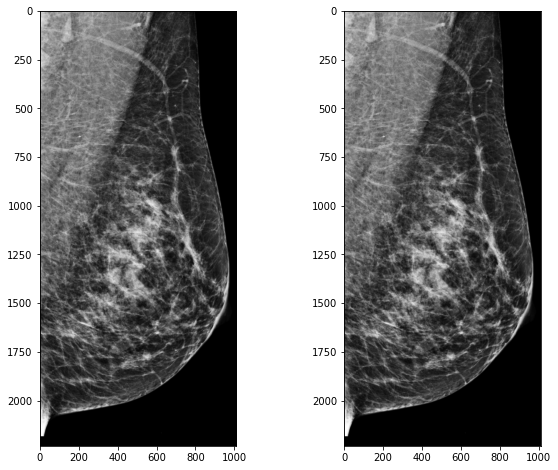

In [83]:
img_noise=add_gaussian_noise(image,0.1)
view_transform(image,img_noise)
print(PSNR(image,img_noise))

PSNR value is 31.568999605704594 dB
None


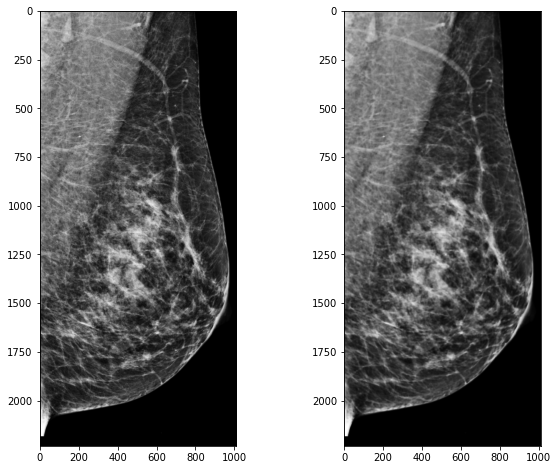

In [84]:
denoised_img=bilateral_blur(np.float32(img_noise),9,50,50)
view_transform(img_noise,denoised_img)
print(PSNR(image,denoised_img))

PSNR value is 62.48774445406916 dB
None


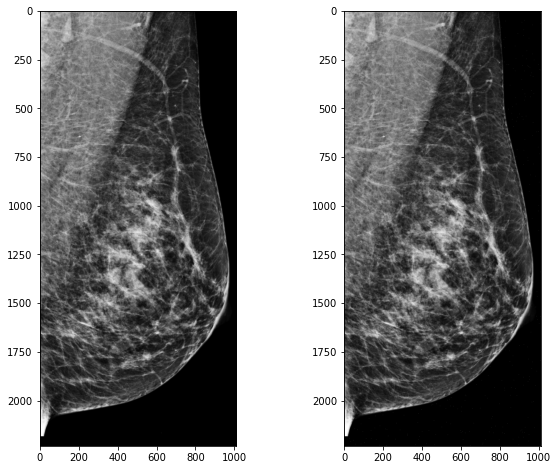

In [85]:
img_noise=add_gaussian_noise(image,0.3)
view_transform(image,img_noise)
print(PSNR(image,img_noise))

PSNR value is 30.361825559106315 dB
None


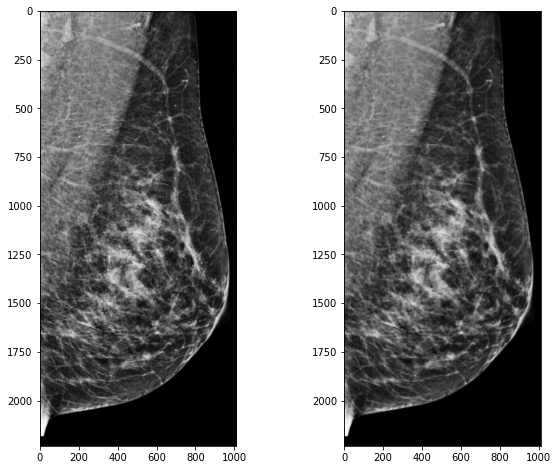

In [86]:
denoised_img=bilateral_blur(np.float32(img_noise),9,50,50)
view_transform(img_noise,denoised_img)
print(PSNR(image,denoised_img))

PSNR value is 45.270947243154076 dB
None


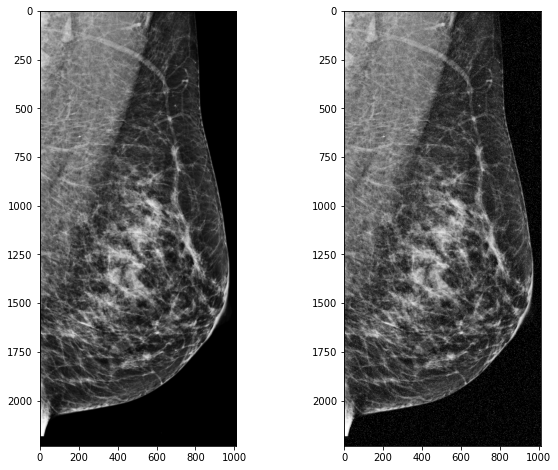

In [87]:
img_noise=add_gaussian_noise(image,0.5)
view_transform(image,img_noise)
print(PSNR(image,img_noise))

PSNR value is 19.027306564537447 dB
None


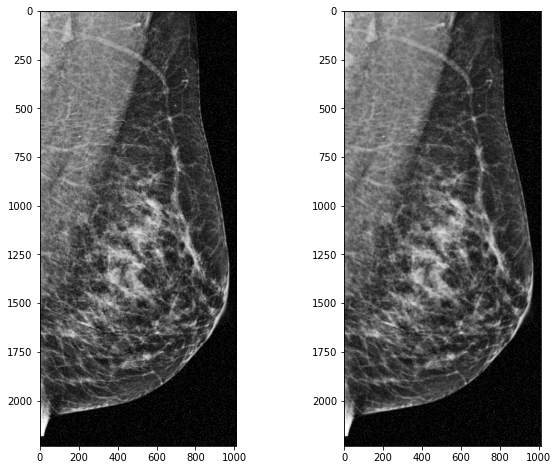

In [88]:
denoised_img=bilateral_blur(np.float32(img_noise),9,50,50)
view_transform(img_noise,denoised_img)
print(PSNR(image,denoised_img))

PSNR value is 38.61124433965644 dB
None


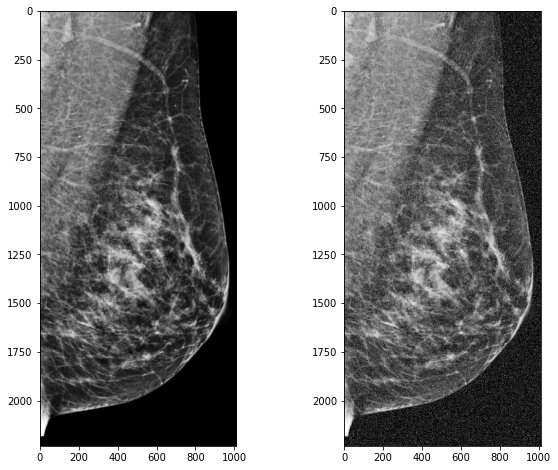

In [89]:
img_noise=add_gaussian_noise(image,0.8)
view_transform(image,img_noise)
print(PSNR(image,img_noise))

PSNR value is 12.276236797554628 dB
None


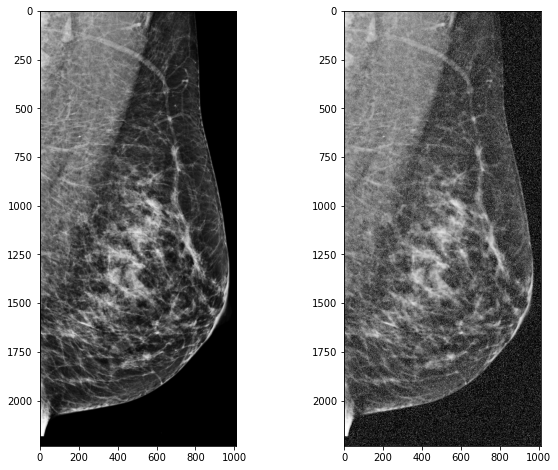

In [90]:
denoised_img=bilateral_blur(np.float32(img_noise),9,50,50)
view_transform(image,denoised_img)
print(PSNR(image,denoised_img))

PSNR value is 36.84320488880822 dB
None


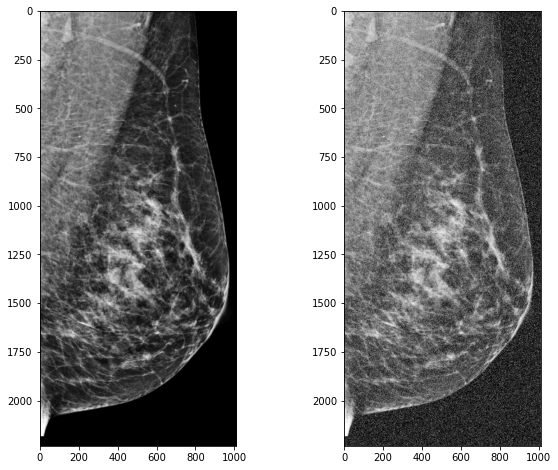

In [91]:
img_noise=add_gaussian_noise(image,1)
view_transform(image,img_noise)
print(PSNR(image,img_noise))

PSNR value is 10.481181727900356 dB
None


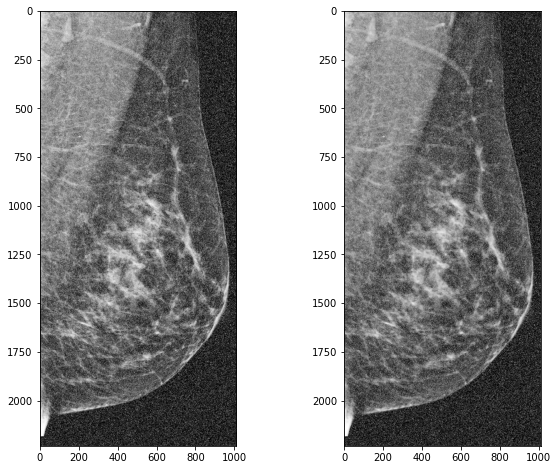

In [92]:
denoised_img=bilateral_blur(np.float32(img_noise),9,50,50)
view_transform(img_noise,denoised_img)
print(PSNR(image,denoised_img))

PSNR value is 34.7402957933979 dB
None


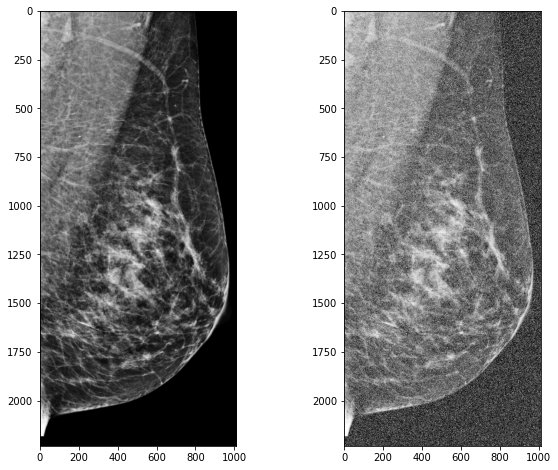

In [93]:
img_noise=add_gaussian_noise(image,1.5)
view_transform(image,img_noise)
print(PSNR(image,img_noise))

PSNR value is 8.400296670855376 dB
None


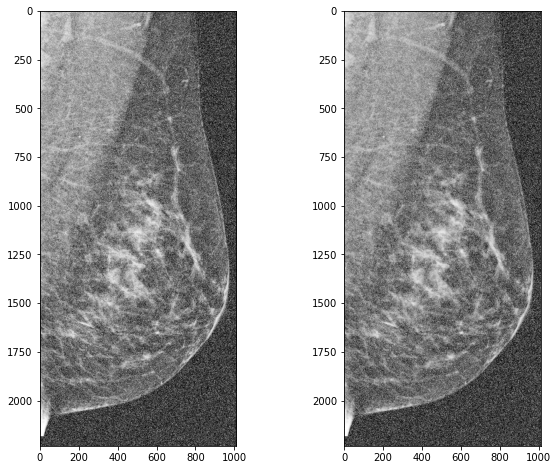

In [94]:
denoised_img=bilateral_blur(np.float32(img_noise),9,50,50)
view_transform(img_noise,denoised_img)
print(PSNR(image,denoised_img))

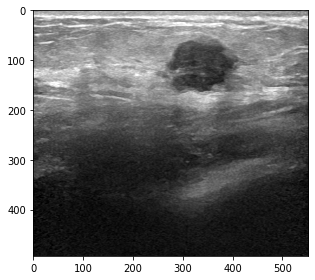

In [95]:
img_path="/content/drive/MyDrive/Colab Notebooks/OpenCV/Ultrasound.jpeg"
Bimage=cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
imshow(Bimage)

100


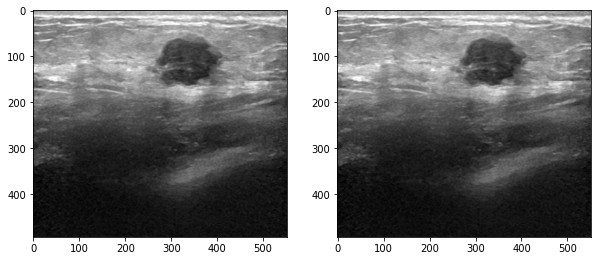

In [96]:
img_noise=add_gaussian_noise(Bimage,0.1)
view_transform(Bimage,img_noise)
print(PSNR(Bimage,img_noise))

PSNR value is 32.27284633452943 dB
None


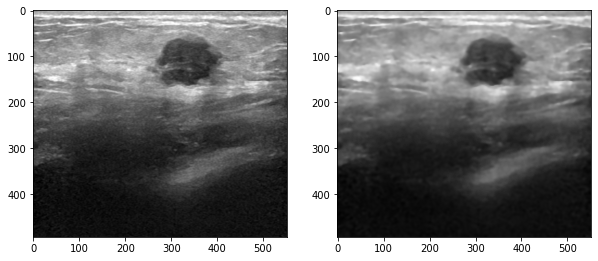

In [97]:
denoised_img=bilateral_blur(np.float32(img_noise),9,50,50)
view_transform(img_noise,denoised_img)
print(PSNR(Bimage,denoised_img))

PSNR value is 61.20469967097733 dB
None


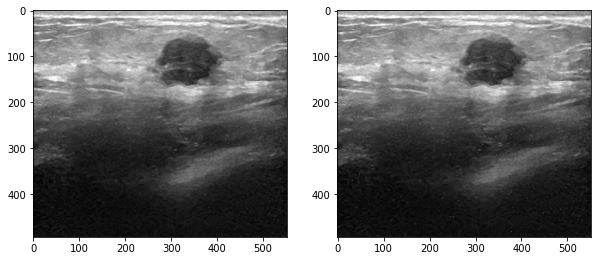

In [98]:
img_noise=add_gaussian_noise(Bimage,0.3)
view_transform(Bimage,img_noise)
print(PSNR(Bimage,img_noise))

PSNR value is 30.967362526662242 dB
None


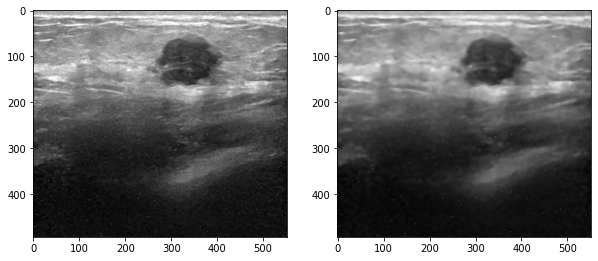

In [99]:
denoised_img=bilateral_blur(np.float32(img_noise),9,50,50)
view_transform(img_noise,denoised_img)
print(PSNR(Bimage,denoised_img))

PSNR value is 44.103315785218385 dB
None


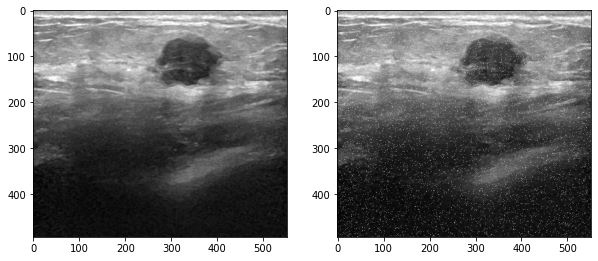

In [100]:
img_noise=add_gaussian_noise(Bimage,0.5)
view_transform(Bimage,img_noise)
print(PSNR(Bimage,img_noise))

PSNR value is 19.876958879971124 dB
None


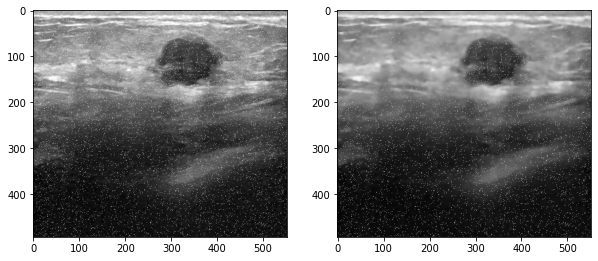

In [101]:
denoised_img=bilateral_blur(np.float32(img_noise),9,50,50)
view_transform(img_noise,denoised_img)
print(PSNR(Bimage,denoised_img))

PSNR value is 37.39221246367401 dB
None


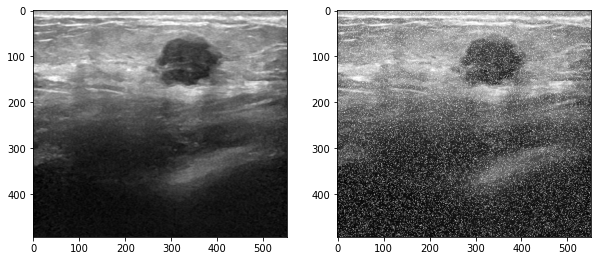

In [102]:
img_noise=add_gaussian_noise(Bimage,0.8)
view_transform(Bimage,img_noise)
print(PSNR(Bimage,img_noise))

PSNR value is 13.052109229499269 dB
None


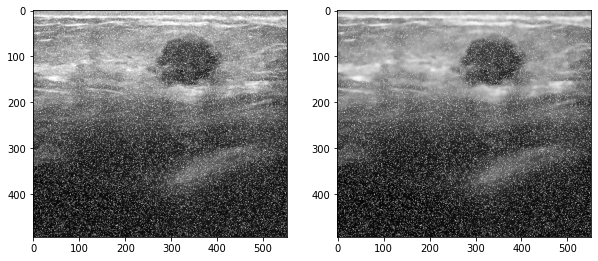

In [103]:
denoised_img=bilateral_blur(np.float32(img_noise),9,50,50)
view_transform(img_noise,denoised_img)
print(PSNR(Bimage,denoised_img))

PSNR value is 35.59815219666171 dB
None


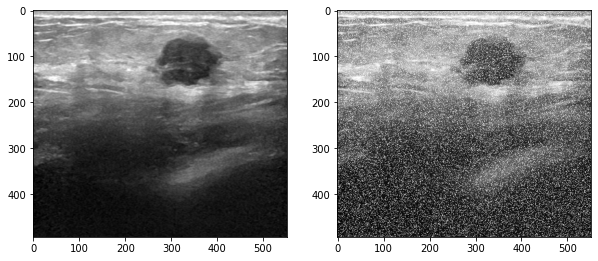

In [104]:
img_noise=add_gaussian_noise(Bimage,1)
view_transform(Bimage,img_noise)
print(PSNR(Bimage,img_noise))

PSNR value is 11.24574290291251 dB
None


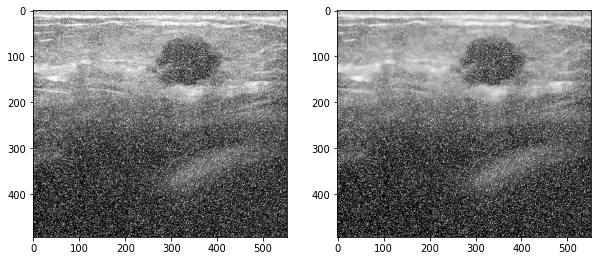

In [105]:
denoised_img=bilateral_blur(np.float32(img_noise),9,50,50)
view_transform(img_noise,denoised_img)
print(PSNR(Bimage,denoised_img))

PSNR value is 33.55233341196904 dB
None


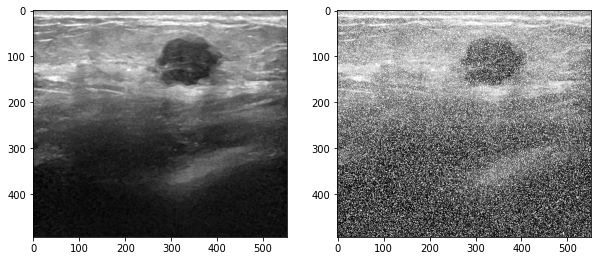

In [106]:
img_noise=add_gaussian_noise(Bimage,1.5)
view_transform(Bimage,img_noise)
print(PSNR(Bimage,img_noise))

PSNR value is 9.151945555438424 dB
None


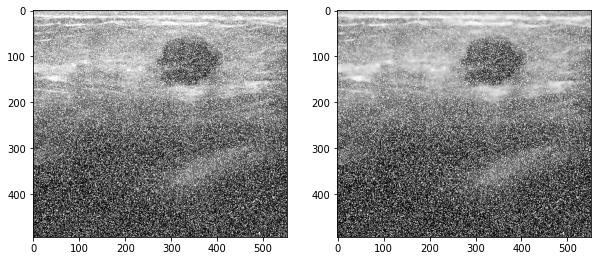

In [107]:
denoised_img=bilateral_blur(np.float32(img_noise),9,50,50)
view_transform(img_noise,denoised_img)
print(PSNR(Bimage,denoised_img))